## algorithm design and anlysis-2025 spring  homework 1 
**Deadline**：2025.5.14

**name**:


note：
---
1. 带有\*的题目，申请免上课的同学，必须完成，其他同学选作；
2. 请独立完成，如求助了他人或者大模型，请著明，并且不可省略算法分析部分；
4. 如若作答有雷同，全部取消成绩；
3. 需要书面作答的题目，可以通过引用图片的形式添加，但是注意上传项目时包含所引用的图片的源文件；
4. $log_n$ 默认表示$log_2{n}$;

## 问题 1

对于下面的每一对表达式(A, B), A是否能表示为B的 $\Theta, \Omega ,O$形式. 请注意, 这些关系中的零个、一个或多个可能成立。列出所有正确的。经常发生一些学生会,把指示写错, 所以请把关系写完整, 例如: $A = O(B),  A =\Theta(B)$, 或$A = \Omega(B)$。

1. $A=n^2-100n, B=n^2$
2. $A=logn, B=log_{1.2}n$
3. $A=3^{2n}, B=2^{4n}$
4. $A=2^{logn}, B=n$
5. $A=\log{\log}{n},B=10^{10^{100}}$

can refer a handwritten picture, pleas upload the picture in /fig/xxx.png
answer: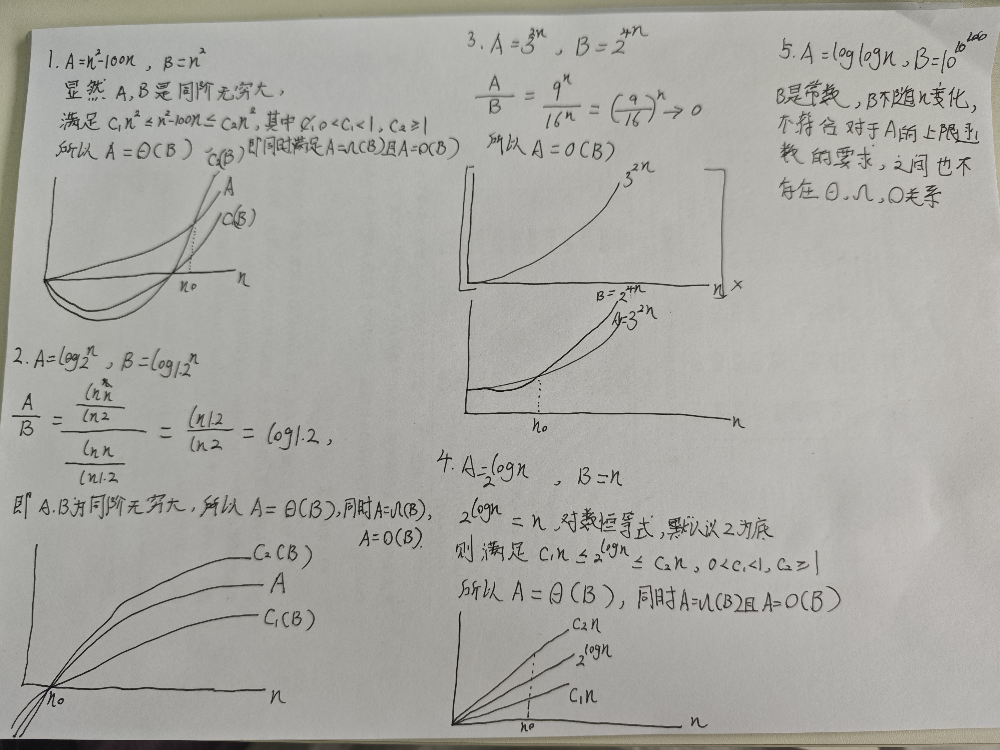

## 问题 2：

假设有函数 $f$ 和 $g$ 使得 $f(n)$ = $O(g(n))$ 对于下面的每一个陈述, 请判断对错, 如果正确请给出证明, 否则请给出一个反例。

1. $\log{f(n)}$ = $O(\log(1+g(n)))$
2. $3^{f(n)}=O(3^{g(n)})$
3. $(f(n))^2=O((g(n))^2)$ 

you can refer a handwritten picture, pleas upload the picture in /fig/xxx.png
answer: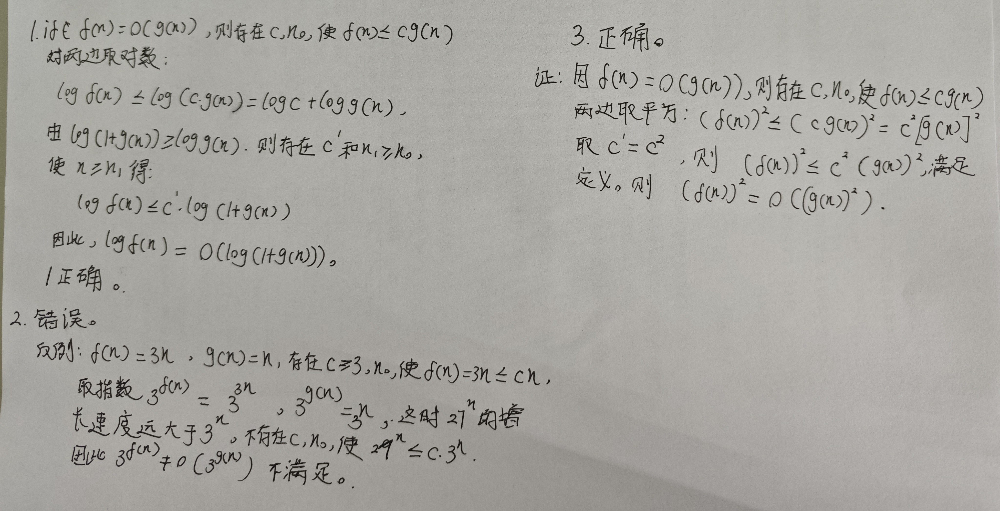

## 问题 3

根据下列递归公式, 计算下列 $T(n)$ 对应的的渐近上界。要求所求的边界尽可能的紧（tight）, 请写明步骤。

1. $T(1)=1; T(n)=T(n/4)+1$ for $n>1$
2. $T(1)=1;T(n)=3T(n/3)+n^2$ for $n>1$
3. $T(1)=1;T(n)=T(2n/3)+1$ for $n>1$
4. $T(1)=1;T(n)=5T(n/4)+n$ for $n>1$
5. $T(n)=1 \ for\ n \le 2 ; T(n)=T(\sqrt{n})+1 \ for \ n>2$

can refer a handwritten picture, pleas upload the picture in /fig/xxx.png
answer: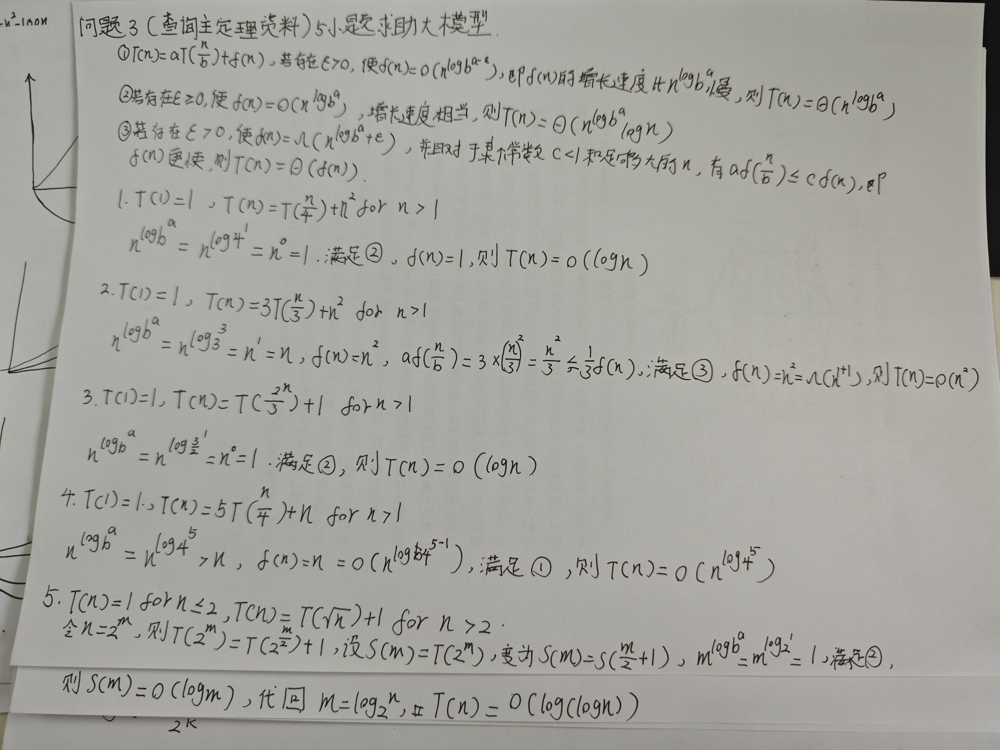

## 问题 4：

给定一个包含n个元素的数组 `profits` , 它的第 `i` 个元素 `profits[i]` 表示一支股票第 `i` 天的**收益**（正数表示涨, 负数表示跌）。你只能选择 **某一天** 买入这只股票, 并选择在 **未来的某一个不同的日子** 卖出该股票。

1. 设计一个算法来计算你所能获取的最大利润和对应买入和卖出的日期。请分析算法方案, 计算其时间复杂度, 并且使用python编程实现该算法。

2. \* 设计一个时间复杂度为 $O(n)$的算法实现该算法

e.g. :
---
profits=[3,2,1,-7,5,2,-1,3,-1], 第5天买入, 第8天卖出, 收益最大：9



idea:

In [15]:
#基于分治的思想，将数组分成两个子数组，所有的子数组会有三种情况，1要么在前一半，2要么在后一半，3要么横跨，
#找出三种情况下收益最大的就是全局最大的，前面两种情况可以通过递归的找到，第三种情况即从中间开始往两边找两段利润最大的加起来，
#因为第三种情况是线性复杂度，所有整体的时间复杂度为T(n)=2T(n/2)+n，根据主定理计算，T(n)=O(nlogn)

def max_subarray(profits, low, high):
    if low == high:
        return (0, low, high)
    mid = (low + high)//2
    left_profit, left_low, left_high = max_subarray(profits,low, mid)
    right_profit, right_low, right_high = max_subarray(profits,mid+1, high)

    #处理中间的情况
    cross_left = float('-inf')
    cross_buy = mid
    temp_sum = 0
    for i in range(mid, low-1, -1):
        temp_sum += profits[i]
        if temp_sum > cross_left:
            cross_left = temp_sum
            cross_buy = i
    
    cross_right = float('-inf')
    cross_sell = mid+1
    temp_sum = 0
    for i in range(mid+1, high+1):
        temp_sum += profits[i]
        if temp_sum > cross_right:
            cross_right = temp_sum
            cross_sell = i
    
    cross_profit = cross_right + cross_left
    
    if left_profit >= right_profit and left_profit >= cross_profit:
        return (left_profit, left_low, left_high)
    elif right_profit >= left_profit and right_profit >= cross_profit:
        return (right_profit, right_low, right_high)
    else:
        return (cross_profit, cross_buy, cross_sell)

def max_profit(profits):
    if not profits:
        return 0, 0, 0
    
    max_profit, buy_day, sell_day = max_subarray(profits, 0, len(profits)-1)
    return (max_profit, buy_day+1, sell_day+1)

profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]
max_profits, buy_day, sell_day = max_profit(profits)
print(f'最大利润：{max_profits},买入天数:{buy_day},卖出天数:{sell_day}')




最大利润：9,买入天数:5,卖出天数:8


In [20]:
# 非免上课学生。仅作尝试。
#profits代表的是相当于代表每天的利润。可构建一个X数组用于储存每天的价格，这消耗空间复杂度S(n)。用最大价格减去最低价格即可得到最大利润，因为遍历三次数组，时间复杂度为0(n).
#如果思考一种空间复杂度为S(1)的算法，其实只需要得到当当天价格最低时的X[i]，然后重置最大利润为0，从下一天开始购入计算利润即可，这样总是从局部的最低价格购入往后计算一定能得到最大利润。
#通过数学关系可以发现如果当前利润是负数，那么当前价格X[i]一定低于Xmin，因此可以胜率部分代码，最终得到时间复杂度为O(n)，空间复杂度S(1)的算法。

def max_profit_linear(profits):
    if not profits:
        return (0, 0, 0)

    profit = 0
    max_profit = float('-inf')
    buy_day = 0
    sell_day = 0
    
    for i in range(0, len(profits)-1):
        profit += profits[i]
        if profit > max_profit:
            max_profit = profit
            sell_day = i
        if profit < 0:
            profit = 0
            buy_day = i + 1
    return (max_profit, buy_day + 1, sell_day + 1)  


# 示例使用
profits = [3, 2, 1, -7, 5, 2, -1, 3, -1]
max_profit_value, buy_day, sell_day = max_profit_linear(profits)
print(f"最大利润为：{max_profit_value}, 在第{buy_day}天买入，第{sell_day}天卖出。")

最大利润为：9, 在第5天买入，第8天卖出。


## 问题 5：

观察下方的分治算法（divide-and-conquer algorithm）的伪代码, 回答下面问题

```latex
DoSomething(A,p,r)
-----
n := r-p+1
if n=2 and A[p]>A[r] then
    swap A[p] and A[r]
else if n >= 3 then
    m = ceil(2n/3)
    DoSomething(A,p,p+m-1)
    DoSomething(A,r-m+1,r)
    DoSomething(A,p,p+m-1)  
    
---
first call: DoSomething(A,1,n)
```

note：$ceil(2n/3)=\left\lceil {2n/3} \right\rceil$；$:=$ 表示赋值, 等价于 $\to$；A是一个包含n的整数元素的数组, 

1. 写出该算法时间复杂度的递归公式, 并求解其对应的渐进表示
2. 描述一下该算法的功能, 并判断是否是最高效的解决方案
3. 使用python编程实现上述算法或其对应的更高效版本的算法


idea：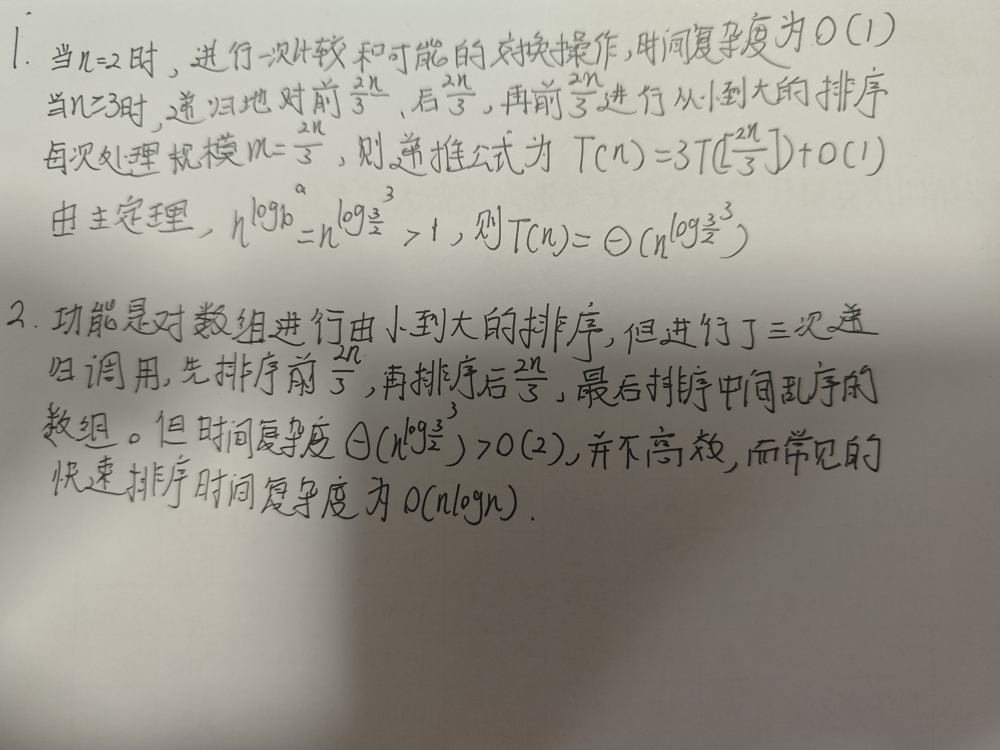

answer:

In [ ]:
# add your code here
#quick sort
import math
import time

#原算法
def DoSomething(A, p, r):
    n = r - p + 1
    if n == 2 and A[p] > A[r]:
        A[p], A[r] = A[r], A[p]
    elif n >= 3:
        m = math.ceil(2 * n / 3)
        DoSomething(A, p, p + m - 1)
        DoSomething(A, r - m + 1, r)
        DoSomething(A, p, p + m - 1)

# 更高效的快速排序实现
def quick_sort(A, left, right):
    if left < right:
        mid = part(A, left, right)
        quick_sort(A, left, mid-1)
        quick_sort(A, mid+1, right)

def part(A, left, right):
    pivot = A[left]
    while left < right:
        while left <right and A[right] >= pivot:
            right-=1
        A[left] = A[right]
        while left < right and A[left] <= pivot:
            left+=1
        A[right] = A[left]
    A[left] = pivot
    return left
    


# 测试代码
A = [3, 1, 4, 1, 5, 9, 2, 6, 5, 3, 5, 2, 5, 78, 9, 4, 1,3, 4,5,7,12,6,1,782,41,134]
n = len(A)
B = A.copy()
C = A.copy()
do_something_times = []
quick_sort_times = []
strat_time = time.time()
DoSomething(B, 0, n - 1)
end_time = time.time()
do_something_times.append(end_time-strat_time)
print("原算法结果:", B,"时间:",do_something_times)

strat_time = time.time()
quick_sort(C, 0, n - 1)
end_time = time.time()
quick_sort_times.append(end_time-strat_time)
print("快速排序结果:", C,"时间",quick_sort_times)

# your algorithm time complexity is :O(nlogn)

原算法结果: [1, 1, 1, 1, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 5, 5, 6, 6, 7, 9, 9, 12, 41, 78, 134, 782] 时间: [0.0010037422180175781]
快速排序结果: [1, 1, 1, 1, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 5, 5, 6, 6, 7, 9, 9, 12, 41, 78, 134, 782] 时间 [0.0009965896606445312]


## 问题 6：

给定一个大小为 `n` 的数组 `nums` , 返回其中的多数元素。多数元素是指在数组中出现次数 **大于** `⌊ n/2 ⌋` 的元素。

你可以假设数组是非空的, 并且给定的数组总是存在多数元素。

1. 设计一个算法找到给定数组的多数元素, 分析算法设计思路, 计算算法时间复杂度, 使用python编程实现
2. \* 设计时间复杂度为 O(n)、空间复杂度为 O(1) 的算法解决此问题, 分析算法设计思路, 使用python编程实现

e.g.:
---
1. nums=[3,2,3], 返回3
2. nums=[2,2,1,1,1,2,2], 返回2


idea：构建一个字典用于存放数组中元素的数量，例如若存在一个3，则在字典的此元素数量+1，检查超过n/2则可以返回数组序号。

In [37]:
# add your code here
def find_majority(nums):
    count = {}
    n = len(nums)
    for i in nums:
        if i in count:
            count[i] += 1
        else:
            count[i] = 1
        if count[i] > n/2:
            return i
    print(r'不存在多数元素')

nums1 = [3,2,3]
nums2 = [2,2,1,1,1,2,2]

more_number = find_majority(nums1)
more_number2 = find_majority(nums2)
print(r"多数元素是",more_number,"和", more_number2)

# your algorithm time complexity is :

多数元素是 3 和 2


idea for 2\*：

In [ ]:
# algorithm time complexity：O(n), space complexity:O(1)

# 非免上课学生，仅作学习。求助互联网。

# Boyer-Moore 投票算法，由于多数元素的出现次数超过半数，即使其他元素联合抵消它，最终剩下的 candidate 一定是多数元素。
# 维护一个候选值 candidate 和其票数 votes。遍历数组，通过票数抵消机制动态更新候选值：若当前数字等于 candidate，票数 +1。
# 否则，票数 -1（相当于抵消一票）。若票数归零，则更换新的 candidate。
# add your code here
def majority_element(nums):
    candidate = None
    vote = 0
    count = 0
    for num in nums:
        if vote == 0:
            candidate = num
        vote += 1 if candidate == num else -1
        if num == candidate:
            count += 1

    return candidate if count > len(nums) // 2 else "没有多数元素"

nums1 = [3,2,3]
nums2 = [2,2,1,1,1,2,2]

more_number = majority_element(nums1)
more_number2 = majority_element(nums2)
print(r"多数元素是",more_number,"和", more_number2)

多数元素是 3 和 2


## 问题 7：

给定一个包含不同整数元素的数组 $ A[1..n]$ ,并且满足条件：$A[1]>A[2]$ 并且 $A[n-1]<A[n]$; 规定：如果一个元素比它两边的邻居元素都小, 即：$A[x]<A[x-1], A[x]<A[x+1]$ , 称这个元素A[x]为“局部最小”。通过遍历一次数组, 我们可以很容易在 $O(n)$的时间复杂度下找到一个局部最小值, 


1. 分析该问题, 设计一个算法在$O(logn)$的时间复杂度下找到一个局部最小(返回数值), 要求：分析算法设计思路, 并且使用python编程实现
2. \* 设计算法找出所有局部最小值, 分析算法设计思路, 并使用python编程实现

e.g.:
---
A=[9, 3, 7, 2, 1, 4, 5 ] 时,  局部最小元素为 3, 1


idea：已知是一个不同整数元素的数组且满足首尾两个元素大于其相邻元素。要达到O(logn)时间复杂度二分查找应该可以。数组的结构保证了两边都是上升趋势，那么一定存在局部最小。

In [ ]:
# add your code here

def find_part_min(nums):
    n = len(nums)
    if n == 1:
        return nums[0]
    
    left = 1
    right = n-2
    while left <= right:
        mid = (left + right) // 2
        if nums[mid] < nums[mid-1] and nums[mid] < nums[mid+1]:
            return nums[mid]
        if nums[mid] > nums[mid-1]:
            right = mid - 1
        else:
            left = mid + 1
        

A = [9, 3, 7, 2, 1, 4, 5]
min_number = find_part_min(A)
print("局部最小元素为" , min_number)
        

# your algorithm time complexity is :O(logn)

局部最小元素为 1


idea:非免课学生，仅学习。 如果是找出所有局部最小，用一个数组储存即可，但想不到O（logn）的时间复杂度，不知道怎么做。

In [ ]:
# add your code here
def find_part_min(nums):
    n = len(nums)
    min_numbers = []
    if n == 1:
        return nums[0]
    
    for i in range(n-1):
        if nums[i] < nums[i-1] and nums[i] < nums[i+1]:
            min_numbers.append(nums[i])
    return min_numbers
        

A = [9, 3, 7, 2, 1, 4, 5]
min_number = find_part_min(A)
print("局部最小元素为" , min_number)

# your algorithm time complexity is :O(n)

局部最小元素为 [3, 1]


## 问题 8：

给定包含n个不同数字的一组数, 寻找一种基于比较的算法在这组数中找到k个最小的数字, 并按顺序输出它们。

1. 将n个数先进行排序, 然后按顺序输出最小的k个数。要求：选择合适的排序算法实现上述操作, 计算算法时间复杂度, 并使用python编程实现。
2. 建立一个包含这n个数的堆（heap）, 并且调用 k 次Extract-min 按顺序输出最小的k个数。使用往空堆中不断插入元素的方法建立堆, 分析这种方法建堆的时间复杂度, 并使用python编程实现
3. \* 假设数组中包含的数据总数目超过了计算机的存储能力, 请设计一个算法, 找到这堆数据的前k小的数值, 计算时间复杂度, 并使用python实现该算法, 假设计算机一定能存储k个数据。

e.g.：
---
数组arr=[5,4,3,2,6,1,88,33,22,107] 的前3个最小数据为：1, 2, 3


idea：

In [68]:
# add your code here
import heapq
#使用快速排序
def quick_sort_K(arr, low, high, k):
    if  n == 1:
        return 
    left = low
    right = high
    pivot = arr[low]
    while left <= right:
        while left <= right and pivot < arr[right]:
            right -= 1
        arr[left] = arr[right]
        while left <= right and pivot > arr[left]:
            left += 1
        arr[right] = arr[left]
    arr[left] = pivot
    quick_sort(arr, low, left)
    quick_sort(arr, left+1, high)



#构建一个堆
def build_heapq(arr, k):
    heap = []

    for num in arr:
        heapq.heappush(heap, num)

    result = []
    for _ in range(k):
        result.append(heapq.heappop(heap))
    return result

arr = [5,4,3,2,6,1,88,33,22,107]
k = 3
quick_sort_K(arr, 0, len(arr)-1, k)
build_heapq(arr,k)
        


# your algorithm time complexity is :

[1, 2, 3]

## 问题 9：

**选择问题**:给定一个包含n个未排序值的数组A和一个$k≤n$的整数, 返回A中最小的第k项。

在课堂上, 学了一个简单的O(n)随机算法来解决选择问题。事实上还有一种更复杂的最坏情况下时间复杂度为$O(n)$ 的选择算法。假设使用一个黑盒过程来实现这个O(n)选择算法: 给定一个数组A、 $p < r$ 和 k,  $BB(A, p, r, k)$ 可以在$O(r−p+ 1)$时间内找到并报告$A[p..r]$中第k小的项的下标。假设你可以在线性时间内处理Partition过程。

1. 请分析如何修改 Quicksork 算法可以使其最差情况下的运行时间为 $O(nlogn)$, 使用伪代码实现, 并分析为何修改后的版本最差情况的运行时间为$O(nlogn)$

note: 伪代码中, 你可以直接调用用` BB(A,p,r,k)`这个函数用于表示在最坏情况下时间复杂度为$O(n)$的选择算法；



2. 找到一个更好的算法报告数组A中的前k小的项, 使用伪代码表示你的算法, 并分析你算法的时间复杂度。

举例：A=[13, 3, 7, 9, 11, 1, 15, 2, 8, 10, 12, 16, 14, 5], 当k=4时, 应该报告1, 2, 3, 4

note： 最直观的方法就是先将数组A排序, 然后从左向右报告其前k项, 这样操作的时间复杂度为$O(nlogn)$. 调用用` BB(A,p,r,k)`设计一个算法使其报告无序数组A的前k项, 满足时间复杂度好于$\Theta(nlogn)$, 并且当$k=\sqrt{n}$时, 你设计的算法时间复杂度应该为$\Theta(n)$.



3. 给定一个大小为n的数组, 找到一个 时间复杂度为$O(n log k)$ 的算法, 该算法将A中的元素重新排序, 使它们被划分为k个部分, 每个部分的元素小于或等于下一部分的元素。假设n和k都是2的幂。使用伪代码表示你的算法, 并分析时间复杂度。

e.g.:
---
数组：[1,  3,  5,  7,  9,  11,  13,  15,  2,  4,  6,  8,  10,  12,  16,  14], k=4, 

对应重新排序的数组为：[1,  3,  2,  4]  [7,  6,  5,  8]  [12,  11,  10,  9]  [13,  14,  16,  15]




## 问题 10：

给定一个包含m个**字符串**的数组A, 其中不同的字符串可能有不同的字符数, 但数组中所有字符串的字符总数为n。设计一个算法在 $O(n)$ 时间内对字符串进行排序, 分析算法设计方案, 计算其时间复杂度, 并基于python编程实现该算法。请注意, 假设字符串只包含"a","b",...,"z", 



举例1：数组A=["a", "da", "bde", "ab", "bc", "abdc", "cdba"], 排序后的数组应该为：['a', 'ab', 'abdc', 'bc', 'bde', 'cdba', 'da']



举例2：数组A=['ab', 'a', 'b', 'abc', 'ba', 'c'], 排序后的数组应该为：

['a', 'ab', 'abc', 'b', 'ba', 'c']



举例3：数组A=['aef', 'yzr', 'wr', 'ab', 'bhjc', 'lkabdc', 'pwcdba'],  排序后的数组应该为：['ab', 'aef', 'bhjc', 'lkabdc', 'pwcdba', 'wr', 'yzr']



note：

-  两个字符之间的比较可以考虑比较他们对应的ASCII码值；
- python中可以使用`ord("a")`返回字符 “a”对应的ASCII值

idea:

In [ ]:
# add your code here
#求助同学，使用字典树，然后按深度优先搜索返回路径。
class TrieNode:
    def __init__(self):
        self.children = {}
        self.is_end = False

def build_trie(words):
    root = TrieNode()
    for word in words:
        node = root
        for char in word:
            if char not in node.children:
                node.children[char] = TrieNode()
            node = node.children[char]
        node.is_end = True
    return root

def dfs(node, path, result):
    if node.is_end:
        result.append(''.join(path))
    for char in sorted(node.children.keys()):
        path.append(char)
        dfs(node.children[char], path, result)
        path.pop()

def sort_strings(A):
    trie = build_trie(A)
    result = []
    dfs(trie, [], result)
    return result

# 测试示例
A1 = ["a", "da", "bde", "ab", "bc", "abdc", "cdba"]
A2 = ['ab', 'a', 'b', 'abc', 'ba', 'c']
A3 = ['aef', 'yzr', 'wr', 'ab', 'bhjc', 'lkabdc', 'pwcdba']

print(sort_strings(A1))
print(sort_strings(A2))  
print(sort_strings(A3))  
# your algorithm time complexity is :
# 时间复杂度分析
# 1. 构建字典树的时间复杂度：
#    - 插入一个长度为 m 的字符串到字典树中，时间复杂度是 O(m)。
#    - 对于 n 个字符串，总时间复杂度是 O(n * m)，其中 n 是字符串的数量，m 是字符串的平均长度。

# 2. DFS 遍历字典树的时间复杂度：
#    - 每个字符只会被访问一次。
#    - 假设字典树中总共有 N 个字符（N = sum(len(word) for word in words)），那么 DFS 遍历所有节点的时间复杂度是 O(N)。
#    - 排序子节点的时间复杂度是 O(k log k)，其中 k 是子节点的数量。在最坏情况下，k 可以达到 26（英文字母表的大小），因此排序的时间复杂度可以视为 O(1)（因为 26 是常数）。
#    - 因此，DFS 的总时间复杂度仍然是 O(N)。

# 3. 总体时间复杂度：
#    - 构建字典树的时间复杂度是 O(n * m)。
#    - DFS 遍历的时间复杂度是 O(N)，其中 N 是所有字符串的总字符数。
#    - 由于 N = n * m，所以总体时间复杂度是 O(n * m)。

# 结论
# 虽然代码中有排序操作，但由于字母表的大小是常数（26个字母），排序的时间复杂度可以忽略不计。
# 因此，整个算法的时间复杂度是 O(n * m)，其中 n 是字符串的数量，m 是字符串的平均长度。
# 题目中提到的 O(n) 时间复杂度是指所有字符串的总字符数，因此这里的 O(n * m) 实际上就是 O(n)。

['a', 'ab', 'abdc', 'bc', 'bde', 'cdba', 'da']
['a', 'ab', 'abc', 'b', 'ba', 'c']
['ab', 'aef', 'bhjc', 'lkabdc', 'pwcdba', 'wr', 'yzr']
